#### FREESURFER

FreeSurfer is a software package that enables you to analyze structural MRI images - in other words, you can use FreeSurfer to quantify the amount of grey matter and white matter in specific regions of the brain. You will also be able to calculate measurements such as the thickness, curvature, and volume of the different tissue types as features, and be able to correlate these with covariates; or, you can contrast these structural measurements between groups.

In [ ]:
# import os
from IPython.display import Image

# from nilearn import plotting
# import nipype.pipeline.engine as pe
# import nipype.interfaces.io as nio
# from nipype.interfaces.freesurfer.preprocess import ReconAll
# from nipype.interfaces.freesurfer.utils import MakeAverageSubject

# import warnings
# warnings.filterwarnings('ignore')

Lets have a quick look at command interface of freesurfer. \
Freesurfer initialize begins with recon-all command. However, there a number of command you can work with data: convertation, group analysis, transormation.

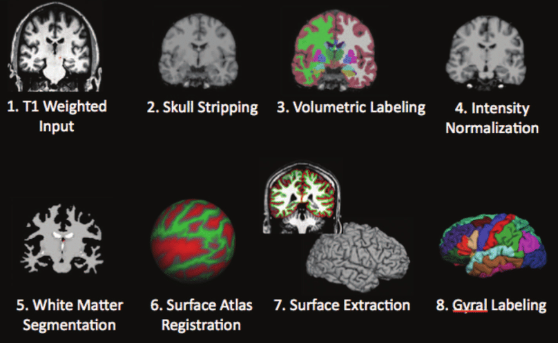

In [2]:
Image(filename = "./assets/freesurfer_stream.png", width=600, height=800)

In [ ]:
# reconall = ReconAll()
# reconall.inputs.subject_id = '100206'
# reconall.inputs.directive = 'autorecon1'
# reconall.inputs.subjects_dir = '/workspace/data'
# reconall.inputs.T1_files = '/workspace/data/raw/100206/unprocessed/3T/T1w_MPR1/100206_3T_T1w_MPR1.nii.gz'
# print(reconall.cmdline)
# reconall.run()

recon-all -autorecon1 -i /workspace/data/raw/100206/unprocessed/3T/T1w_MPR1/100206_3T_T1w_MPR1.nii.gz -subjid 100206 -sd /workspace/data
250907-15:24:48,654 nipype.interface INFO:
	 stdout 2025-09-07T15:24:48.654084:Subject Stamp: freesurfer-Linux-centos6_x86_64-stable-pub-v6.0.1-f53a55a
250907-15:24:48,654 nipype.interface INFO:
	 stdout 2025-09-07T15:24:48.654084:Current Stamp: freesurfer-Linux-centos6_x86_64-stable-pub-v6.0.1-f53a55a
250907-15:24:48,660 nipype.interface INFO:
	 stdout 2025-09-07T15:24:48.660509:INFO: SUBJECTS_DIR is /workspace/data
250907-15:24:48,663 nipype.interface INFO:
	 stdout 2025-09-07T15:24:48.663516:Actual FREESURFER_HOME /opt/freesurfer-6.0.1
250907-15:24:48,695 nipype.interface INFO:
	 stdout 2025-09-07T15:24:48.695508:Linux ba282536a055 5.15.0-140-generic #150-Ubuntu SMP Sat Apr 12 06:00:09 UTC 2025 x86_64 x86_64 x86_64 GNU/Linux
250907-15:24:49,218 nipype.interface INFO:
	 stdout 2025-09-07T15:24:49.218764:'/opt/freesurfer-6.0.1/bin/recon-all' -> '/wor

Usually it takes 6-18 hours to preprocess for 1 subject, better think of parallelization:

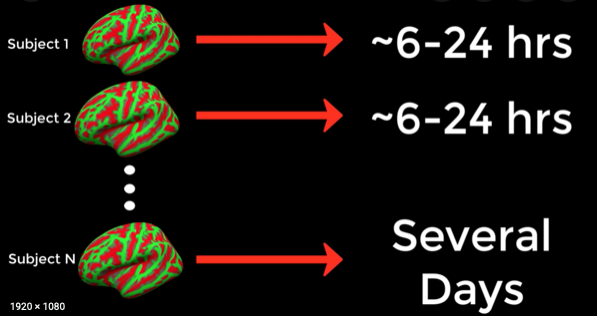

In [4]:
Image(filename = "./assets/freesurfer_runtime.png", width=600, height=800)

In [ ]:
# !cat /workspace/multiproc.sh

#! /bin/bash

export SUBJECTS_DIR=/workspace
export input_path=/workspace/data/raw

ids=()

for dirname in /${input_path}/*; do

    subj_id=${dirname#/${input_path}/}  # remove "/input/sub-"
    subj_id=${subj_id%/}  # remove trailing "/"

    if [[ ! -d "/output/$subj_id" ]]; then
        ids+=( "$subj_id" )
    fi
done

printf 'Found ID: %s\n' "${ids[@]}" >&2

printf '%s\n' "${ids[@]}" | parallel --jobs 10 --timeout 250% --progress recon-all -expert /workspace/data/expert.opts -s {.} -i ${input_path}/{.}/unprocessed/3T/T1w_MPR1/{.}_3T_T1w_MPR1.nii.gz -all -qcache

Output sctructure of freesurfer preprocessing.

In [ ]:
# !tree ./data/freesurfer_preproc --filelimit 40

./data/freesurfer_preproc
└── 100206
    ├── label [73 entries exceeds filelimit, not opening dir]
    ├── mri
    │   ├── aparc.a2009s+aseg.mgz
    │   ├── aparc+aseg.mgz
    │   ├── aparc.DKTatlas+aseg.mgz
    │   ├── aseg.auto.mgz
    │   ├── aseg.auto_noCCseg.label_intensities.txt
    │   ├── aseg.auto_noCCseg.mgz
    │   ├── aseg.mgz
    │   ├── aseg.presurf.hypos.mgz
    │   ├── aseg.presurf.mgz
    │   ├── brain.finalsurfs.mgz
    │   ├── brainmask.auto.mgz
    │   ├── brainmask.mgz
    │   ├── brain.mgz
    │   ├── ctrl_pts.mgz
    │   ├── filled.mgz
    │   ├── lh.ribbon.mgz
    │   ├── mri_nu_correct.mni.log
    │   ├── mri_nu_correct.mni.log.bak
    │   ├── norm.mgz
    │   ├── nu.mgz
    │   ├── orig
    │   │   └── 001.mgz
    │   ├── orig.mgz
    │   ├── orig_nu.mgz
    │   ├── rawavg.mgz
    │   ├── rh.ribbon.mgz
    │   ├── ribbon.mgz
    │   ├── segment.dat
    │   ├── T1.mgz
    │   ├── talairach.label_intensities.txt
    │   ├── talairach.log
    │   ├── talairach_wi

#### Freesurfer Output Visualization

In [ ]:
# import matplotlib
# cdict = {'red': ((0.0, 0.0, 0.0),
#                  (0.1, 0.5, 0.5),
#                  (0.2, 0.0, 0.0),
#                  (0.4, 0.2, 0.2),
#                  (0.6, 0.0, 0.0),
#                  (0.8, 1.0, 1.0),
#                  (1.0, 1.0, 1.0)),
#         'green':((0.0, 0.0, 0.0),
#                  (0.1, 0.0, 0.0),
#                  (0.2, 0.0, 0.0),
#                  (0.4, 1.0, 1.0),
#                  (0.6, 1.0, 1.0),
#                  (0.8, 1.0, 1.0),
#                  (1.0, 0.0, 0.0)),
#         'blue': ((0.0, 0.0, 0.0),
#                  (0.1, 0.5, 0.5),
#                  (0.2, 1.0, 1.0),
#                  (0.4, 1.0, 1.0),
#                  (0.6, 0.0, 0.0),
#                  (0.8, 0.0, 0.0),
#                  (1.0, 0.0, 0.0))}

# my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)
# my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,64,1.9)

For example, lets plot cortical thickness on inflated and pial surfaces.

In [ ]:
# inflated_path = '/workspace/data/freesurfer_preproc/100206/surf/lh.inflated'
# pial_path = '' # add '/workspace/data/freesurfer_preproc/100206/surf/lh.pial'
# thickness_data = '/workspace/data/freesurfer_preproc/100206/surf/lh.thickness'
# plot_pial_lh = plotting.view_surf(inflated_path, thickness_data, threshold=0, cmap=my_cmap, black_bg=True)
# plot_pial_lh # try pial

Plot cortical and subcortical segmentation maps

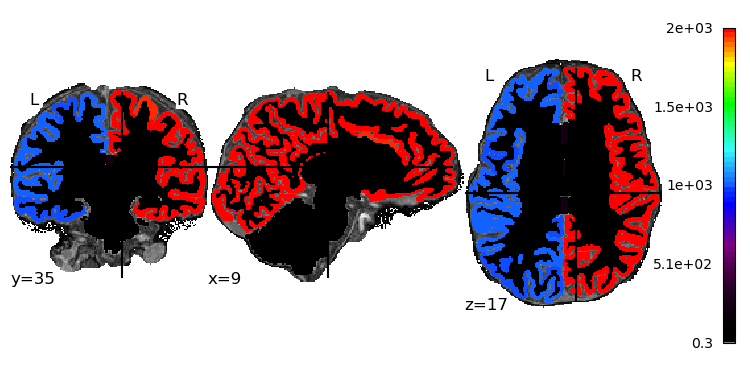

In [ ]:
# plotting.plot_img('/workspace/data/freesurfer_preproc/100206/mri/aparc+aseg.mgz', bg_img='/workspace/data/freesurfer_preproc/100206/mri/brain.mgz',cmap=my_cmap,threshold=0.3)

The FreeSurfer utilities mris_ca_train and mris_ca_label together implement a technique for automatically assigning a neuroanatomical label to each location on a cortical surface model based on probabilistic information estimated from a manually labeled training set (made using FreeSurfer). This procedure incorporates both geometric information derived from the cortical model, and neuroanatomical convention, as found in the training set. The result is a complete labeling of cortical sulci and gyri.

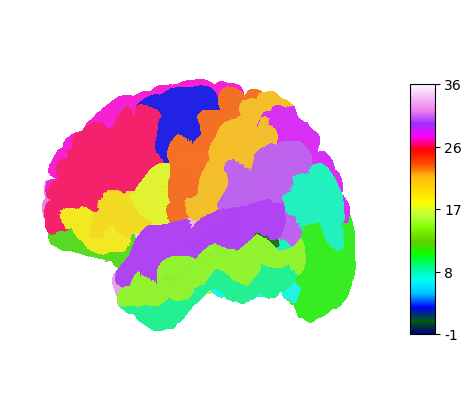

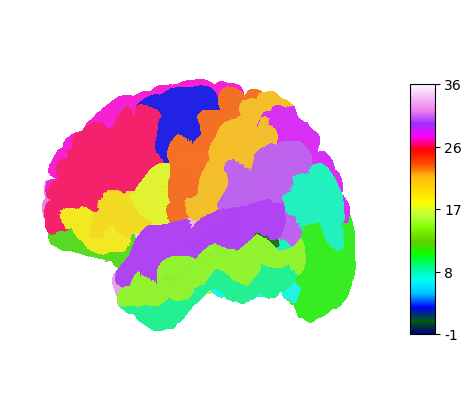

In [ ]:
# import numpy as np
# import nibabel

# labels, ctab, shape = nibabel.freesurfer.io.read_annot('/workspace/data/freesurfer_preproc/100206/label/lh.aparc.annot')
# plotting.plot_surf_roi(pial_path, roi_map=labels,
#                        hemi='left', view='lateral',
#                        bg_on_data=True,
#                        darkness=.5)

#### Extract features from stats data:

After recon-all finishes, there will be a file called subject/stats/aseg.stats. This is a table of volume and intensity statistics for each segmentation. It also contains the following metrics:
https://surfer.nmr.mgh.harvard.edu/fswiki/MorphometryStats

In [ ]:
# !cat /workspace/data/freesurfer_preproc/100206/stats/aseg.stats

# Title Segmentation Statistics 
# 
# generating_program mri_segstats
# cvs_version $Id: mri_segstats.c,v 1.121 2016/05/31 17:27:11 greve Exp $
# cmdline mri_segstats --seg mri/aseg.mgz --sum stats/aseg.stats --pv mri/norm.mgz --empty --brainmask mri/brainmask.mgz --brain-vol-from-seg --excludeid 0 --excl-ctxgmwm --supratent --subcortgray --in mri/norm.mgz --in-intensity-name norm --in-intensity-units MR --etiv --surf-wm-vol --surf-ctx-vol --totalgray --euler --ctab /opt/freesurfer/ASegStatsLUT.txt --subject 100206 
# sysname  Linux
# hostname 1a7395895a55
# machine  x86_64
# user     root
# anatomy_type volume
# 
# SUBJECTS_DIR /output
# subjectname 100206
# Measure BrainSeg, BrainSegVol, Brain Segmentation Volume, 1470849.000000, mm^3
# Measure BrainSegNotVent, BrainSegVolNotVent, Brain Segmentation Volume Without Ventricles, 1453011.000000, mm^3
# Measure BrainSegNotVentSurf, BrainSegVolNotVentSurf, Brain Segmentation Volume Without Ventricles from Surf, 1452876.726903, mm^3
# Measu

In [ ]:
# import pandas as pd
# seg_data_path = '/workspace/data/freesurfer_preproc/100206/stats/aseg.stats'

# ColHeader = next(filter(lambda line: line.startswith('# ColHeaders'), open(seg_data_path).readlines()))
# names = ColHeader.split()[2:]
# data = pd.read_csv(seg_data_path, names=names, comment='#', delim_whitespace=True, dtype=str)
# data

,Index,SegId,NVoxels,Volume_mm3,StructName,normMean,normStdDev,normMin,normMax,normRange
0,1,4,5818,6133.0,Left-Lateral-Ventricle,39.9612,13.9089,13.0000,96.0000,83.0000
1,2,5,441,506.6,Left-Inf-Lat-Vent,43.5760,13.0834,16.0000,76.0000,60.0000
2,3,7,15801,16163.4,Left-Cerebellum-White-Matter,82.5396,6.3459,23.0000,101.0000,78.0000
3,4,8,64292,64111.8,Left-Cerebellum-Cortex,66.0997,10.3350,14.0000,101.0000,87.0000
4,5,10,10560,10387.0,Left-Thalamus-Proper,86.6050,8.2517,32.0000,108.0000,76.0000
5,6,11,4671,4659.8,Left-Caudate,75.4425,6.7038,46.0000,106.0000,60.0000
6,7,12,5832,5863.3,Left-Putamen,80.4276,6.3339,46.0000,104.0000,58.0000
7,8,13,3091,2967.5,Left-Pallidum,89.2090,6.1022,56.0000,108.0000,52.0000
8,9,14,1181,1189.0,3rd-Ventricle,37.5013,12.6592,15.0000,74.0000,59.0000
9,10,15,1627,1682.9,4th-Ventricle,37.1709,12.0587,14.0000,72.0000,58.0000
